<a href="https://colab.research.google.com/github/Sablabra/Project_in_stat/blob/main/Project_in_stat.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <img src="https://github.com/JuliaLang/julia-logo-graphics/raw/master/images/julia-logo-color.png" height="100" /> _Colab Notebook Template_

## Instructions
1. Work on a copy of this notebook: _File_ > _Save a copy in Drive_ (you will need a Google account). Alternatively, you can download the notebook using _File_ > _Download .ipynb_, then upload it to [Colab](https://colab.research.google.com/).
2. If you need a GPU: _Runtime_ > _Change runtime type_ > _Harware accelerator_ = _GPU_.
3. Execute the following cell (click on it and press Ctrl+Enter) to install Julia, IJulia and other packages (if needed, update `JULIA_VERSION` and the other parameters). This takes a couple of minutes.
4. Reload this page (press Ctrl+R, or ⌘+R, or the F5 key) and continue to the next section.

_Notes_:
* If your Colab Runtime gets reset (e.g., due to inactivity), repeat steps 2, 3 and 4.
* After installation, if you want to change the Julia version or activate/deactivate the GPU, you will need to reset the Runtime: _Runtime_ > _Factory reset runtime_ and repeat steps 3 and 4.

In [ ]:
%%shell
set -e

#---------------------------------------------------#
JULIA_VERSION="1.6.0" # any version ≥ 0.7.0
JULIA_PACKAGES="IJulia BenchmarkTools Plots"
JULIA_PACKAGES_IF_GPU="CUDA" # or CuArrays for older Julia versions
JULIA_NUM_THREADS=2
#---------------------------------------------------#

if [ -n "$COLAB_GPU" ] && [ -z `which julia` ]; then
  # Install Julia
  JULIA_VER=`cut -d '.' -f -2 <<< "$JULIA_VERSION"`
  echo "Installing Julia $JULIA_VERSION on the current Colab Runtime..."
  BASE_URL="https://julialang-s3.julialang.org/bin/linux/x64"
  URL="$BASE_URL/$JULIA_VER/julia-$JULIA_VERSION-linux-x86_64.tar.gz"
  wget -nv $URL -O /tmp/julia.tar.gz # -nv means "not verbose"
  tar -x -f /tmp/julia.tar.gz -C /usr/local --strip-components 1
  rm /tmp/julia.tar.gz

  # Install Packages
  if [ "$COLAB_GPU" = "1" ]; then
      JULIA_PACKAGES="$JULIA_PACKAGES $JULIA_PACKAGES_IF_GPU"
  fi
  for PKG in `echo $JULIA_PACKAGES`; do
    echo "Installing Julia package $PKG..."
    julia -e 'using Pkg; pkg"add '$PKG'; precompile;"' &> /dev/null
  done

  # Install kernel and rename it to "julia"
  echo "Installing IJulia kernel..."
  julia -e 'using IJulia; IJulia.installkernel("julia", env=Dict(
      "JULIA_NUM_THREADS"=>"'"$JULIA_NUM_THREADS"'"))'
  KERNEL_DIR=`julia -e "using IJulia; print(IJulia.kerneldir())"`
  KERNEL_NAME=`ls -d "$KERNEL_DIR"/julia*`
  mv -f $KERNEL_NAME "$KERNEL_DIR"/julia  

  echo ''
  echo "Success! Please reload this page and jump to the next section."
fi

Installing Julia 1.6.0 on the current Colab Runtime...
2021-08-26 12:30:55 URL:https://storage.googleapis.com/julialang2/bin/linux/x64/1.6/julia-1.6.0-linux-x86_64.tar.gz [112838927/112838927] -> "/tmp/julia.tar.gz" [1]
Installing Julia package IJulia...
Installing Julia package BenchmarkTools...
Installing Julia package Plots...
Installing IJulia kernel...
[ Info: Installing julia kernelspec in /root/.local/share/jupyter/kernels/julia-1.6

Success! Please reload this page and jump to the next section.


# Checking the Installation
The `versioninfo()` function should print your Julia version and some other info about the system:

In [1]:
versioninfo()

Julia Version 1.6.0
Commit f9720dc2eb (2021-03-24 12:55 UTC)
Platform Info:
  OS: Linux (x86_64-pc-linux-gnu)
  CPU: Intel(R) Xeon(R) CPU @ 2.30GHz
  WORD_SIZE: 64
  LIBM: libopenlibm
  LLVM: libLLVM-11.0.1 (ORCJIT, haswell)
Environment:
  JULIA_NUM_THREADS = 2


In [2]:
using BenchmarkTools

M = rand(2048, 2048)
@benchmark M^2

BenchmarkTools.Trial: 10 samples with 1 evaluation.
 Range (min … max):  524.176 ms … 643.742 ms  ┊ GC (min … max): 0.21% … 19.27%
 Time  (median):     532.353 ms               ┊ GC (median):    0.10%
 Time  (mean ± σ):   544.386 ms ±  35.617 ms  ┊ GC (mean ± σ):  2.80% ±  6.04%

  █ █▁▁   ▁▁▁                                                 ▁  
  █▁███▁▁▁███▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█ ▁
  524 ms           Histogram: frequency by time          644 ms <

 Memory estimate: 32.00 MiB, allocs estimate: 2.

In [3]:
if ENV["COLAB_GPU"] == "1"
    using CUDA

    M_gpu = cu(M)
    @benchmark CUDA.@sync M_gpu^2
else
    println("No GPU found.")
end

No GPU found.


Adding the relevant package

In [4]:
using Pkg
Pkg.add("BayesianNonparametricStatistics")

    Updating registry at `~/.julia/registries/General`
   Resolving package versions...
   Installed OpenSpecFun_jll ───────────────── v0.5.5+0
   Installed Rmath ─────────────────────────── v0.7.0
   Installed LogExpFunctions ───────────────── v0.3.0
   Installed FillArrays ────────────────────── v0.11.9
   Installed StatsFuns ─────────────────────── v0.9.9
   Installed BayesianNonparametricStatistics ─ v0.3.0
   Installed QuadGK ────────────────────────── v2.4.1
   Installed Distributions ─────────────────── v0.24.18
   Installed Rmath_jll ─────────────────────── v0.3.0+0
   Installed SpecialFunctions ──────────────── v1.6.1
   Installed PDMats ────────────────────────── v0.11.1
   Installed IrrationalConstants ───────────── v0.1.0
   Installed ChainRulesCore ────────────────── v1.3.0
   Installed DocStringExtensions ───────────── v0.8.5
    Updating `~/.julia/environments/v1.6/Project.toml`
  [f7704626] + BayesianNonparametricStatistics v0.3.0
    Updating `~/.julia/environments/v1.

In [5]:
using BayesianNonparametricStatistics

# Simulate an SDE. 

Specify SDE with variance 1 and beginvalue 0 and end time 1000.
$$\begin{cases}X_0=0.0\\
dX_t = \theta(X_t)dt + 1.0dW_t\end{cases}$$
$\theta$ is not specified at this moment yet. 

In [7]:
# implement SDE dX_t=sin(2\pi X_t)dt+dW_t, 
# starting at zero till time 1000.0, discretised 
# with precision 0.01.
model = SDEModel(1.0,0.0,1000.0,0.01)

SDEModel{Float64}(1.0, 0.0, 1000.0, 0.01)

## Specify the drift function
$$\theta(x)=\sin(2\pi x)$$
altogether
$$\begin{cases}
X_0=0\\
dX_t=\sin(2\pi x)dt + dW_t.\end{cases}$$

In [8]:
sde = SDE(x->sinpi(2*x),model)

SDE{var"#1#2", SDEModel{Float64}}(var"#1#2"(), SDEModel{Float64}(1.0, 0.0, 1000.0, 0.01))

In [9]:
sde = SDE(x->-1.5*(x-2),model)

SDE{var"#3#4", SDEModel{Float64}}(var"#3#4"(), SDEModel{Float64}(1.0, 0.0, 1000.0, 0.01))

## Random path from SDE.

In [10]:
# Sample from sde.
X = rand(sde)

SamplePath{StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}}, Vector{Float64}}(0.0:0.01:1000.0, [0.0, 0.13458731517524913, 0.14132070318972512, 0.22838431166129622, 0.14302128139306491, 0.18079721592611173, 0.4003808870409311, 0.4761262596200798, 0.4883304495601563, 0.4431749226768692  …  1.856497524086154, 1.9095672989725543, 1.834706180996338, 1.8737486226280309, 2.028044046526243, 1.993141107169133, 2.0157445121316244, 2.1141729901465025, 2.2146959213968267, 2.3622056805842147])

## Plot the path.

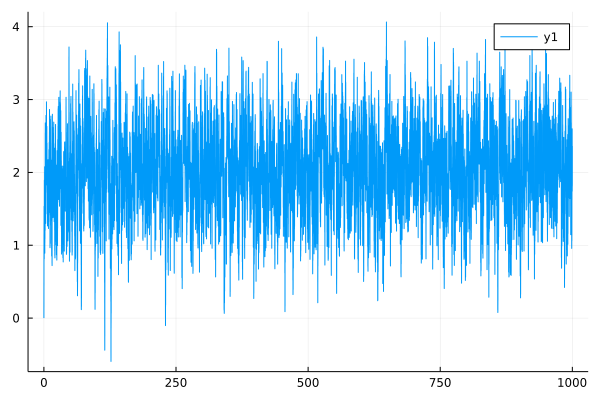

In [11]:
# Plot X. 
using Plots # Plots package in Julia. 
plot(X.timeinterval, X.samplevalues)

## Calculate the posterior

### Specify the prior

$$ \theta(x) = \sum_{k=1}^{50} k^{-1} Z_k \phi_k(x)\approx \sum_{k=1}^\infty k^{-1} Z_k \phi_k(x).$$

In [12]:
using LinearAlgebra, SparseArrays # packages to work with matrices.

### Distribution on the coefficients. 

In [ ]:
distribution = GaussianVector(sparse(Diagonal([k^(-0.5-1.5) for k in 1.0:50.0])));

In [ ]:
model = SDEModel(1.0, 0.0, 10000.0, 0.1)
sde = SDE(x->sinpi(2*x), model)
X = rand(sde)
Π = FaberSchauderExpansionWithGaussianCoefficients([2.0^j for j in 0:5])
postΠ = calculateposterior(Π, X, model)

FaberSchauderExpansionWithGaussianCoefficients{GaussianVector{Vector{Float64}, Symmetric{Float64, Matrix{Float64}}, Matrix{Float64}}}(10, Function[BayesianNonparametricStatistics.faberschauderone, BayesianNonparametricStatistics.var"#5#6"{Int64, Int64}(0, 1), BayesianNonparametricStatistics.var"#5#6"{Int64, Int64}(1, 1), BayesianNonparametricStatistics.var"#5#6"{Int64, Int64}(1, 2), BayesianNonparametricStatistics.var"#5#6"{Int64, Int64}(2, 1), BayesianNonparametricStatistics.var"#5#6"{Int64, Int64}(2, 2), BayesianNonparametricStatistics.var"#5#6"{Int64, Int64}(2, 3), BayesianNonparametricStatistics.var"#5#6"{Int64, Int64}(2, 4), BayesianNonparametricStatistics.var"#5#6"{Int64, Int64}(3, 1), BayesianNonparametricStatistics.var"#5#6"{Int64, Int64}(3, 2)  …  BayesianNonparametricStatistics.var"#5#6"{Int64, Int64}(10, 1015), BayesianNonparametricStatistics.var"#5#6"{Int64, Int64}(10, 1016), BayesianNonparametricStatistics.var"#5#6"{Int64, Int64}(10, 1017), BayesianNonparametricStatistics.

In [ ]:
using Distributions

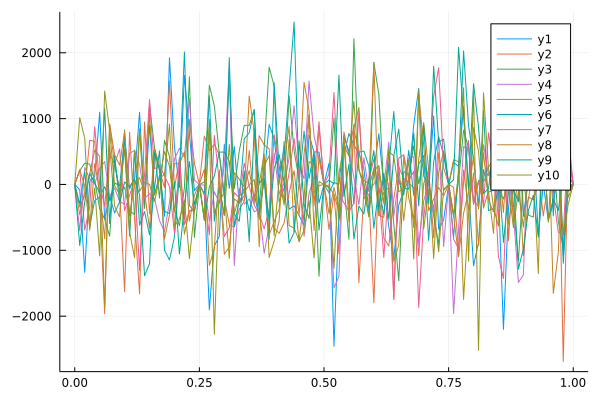

In [ ]:
# sample 5 times from prior
p=plot()
x = 0.0:0.01:1
for k in 1:10
f = rand(Π)
y = f.(x)
plot!(p,x,y,show=true)
end
p

### Gaussian process prior

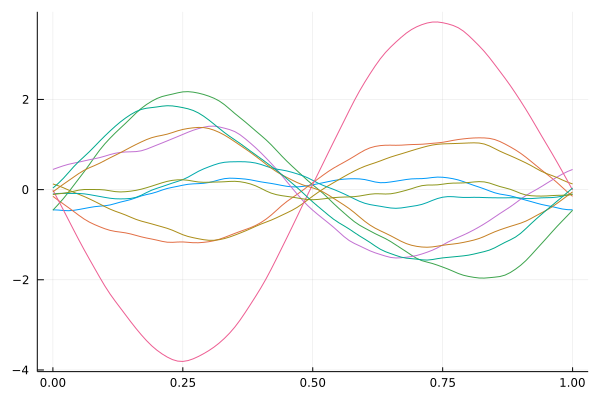

In [ ]:
Π = GaussianProcess([fourier(k) for k in 1:50], distribution)

# sample 5 times from prior
p=plot()
x = 0.0:0.01:1
for k in 1:10
f = rand(Π)
y = f.(x)
plot!(p,x,y,show=true, legend = false)
end
p

## Calculate the posterior

In [ ]:
postΠ = calculateposterior(Π, X, model)

GaussianProcess{Vector{Function}, GaussianVector{Vector{Float64}, Symmetric{Float64, Matrix{Float64}}, Matrix{Float64}}}(Function[BayesianNonparametricStatistics.var"#1#3"{Int64, Float64}(1, 1.4142135623730951), BayesianNonparametricStatistics.var"#2#4"{Int64, Float64}(2, 1.4142135623730951), BayesianNonparametricStatistics.var"#1#3"{Int64, Float64}(3, 1.4142135623730951), BayesianNonparametricStatistics.var"#2#4"{Int64, Float64}(4, 1.4142135623730951), BayesianNonparametricStatistics.var"#1#3"{Int64, Float64}(5, 1.4142135623730951), BayesianNonparametricStatistics.var"#2#4"{Int64, Float64}(6, 1.4142135623730951), BayesianNonparametricStatistics.var"#1#3"{Int64, Float64}(7, 1.4142135623730951), BayesianNonparametricStatistics.var"#2#4"{Int64, Float64}(8, 1.4142135623730951), BayesianNonparametricStatistics.var"#1#3"{Int64, Float64}(9, 1.4142135623730951), BayesianNonparametricStatistics.var"#2#4"{Int64, Float64}(10, 1.4142135623730951)  …  BayesianNonparametricStatistics.var"#1#3"{Int6

## Sample from the posterior

In [ ]:
scalefactor = 0.01
 m = Π.distribution.mean
 Σ = Π.distribution.Σ
 d = GaussianVector(scalefactor *zeros(64), Σ);

In [ ]:
kuk = GaussianVector(postΠ.distribution.mean, postΠ.distribution.var)

GaussianVector{Vector{Float64}, Matrix{Float64}, Matrix{Float64}}([0.07585940325811436, 0.09674930029573059, 0.9977404367460013, -1.0002373680910464, 0.08168743930319666, 0.16380278051143354, -0.2854228199733278, -0.2889355100825559, 0.12632335182188967, 0.16498938115722311  …  -0.1409667243060464, -0.07663045027778881, -0.05747665909974262, 0.21566307442276536, -0.09722066683184909, -0.07874621910483912, -0.011821710229927002, 0.15388041900598418, 0.32375666246520096, -0.09521870744389745], [0.012035866947069032 -1.576415737018311e-5 … -0.0006977713661348147 -0.009586804898662609; -1.576415737018311e-5 0.010500194225316187 … 9.138983511772353e-7 1.2556460355829042e-5; … ; -0.0006977713661348147 9.138983511772353e-7 … 0.025509853922739308 0.008154272967400004; -0.009586804898662609 1.2556460355829042e-5 … 0.008154272967400004 0.025409730175412266], [0.0005987163275639558 6.156942133127929e-5 … -4.0169739012214475e-5 -0.0006010622511187031; 6.156942133127929e-5 0.00045631876003196883 … 

In [ ]:
Π = GaussianProcess([fourier(k) for k in 1:64], kuk);

In [ ]:
postΠ = calculateposterior(Π, X, model)

GaussianProcess{Vector{Function}, GaussianVector{Vector{Float64}, Symmetric{Float64, Matrix{Float64}}, Matrix{Float64}}}(Function[BayesianNonparametricStatistics.var"#1#3"{Int64, Float64}(1, 1.4142135623730951), BayesianNonparametricStatistics.var"#2#4"{Int64, Float64}(2, 1.4142135623730951), BayesianNonparametricStatistics.var"#1#3"{Int64, Float64}(3, 1.4142135623730951), BayesianNonparametricStatistics.var"#2#4"{Int64, Float64}(4, 1.4142135623730951), BayesianNonparametricStatistics.var"#1#3"{Int64, Float64}(5, 1.4142135623730951), BayesianNonparametricStatistics.var"#2#4"{Int64, Float64}(6, 1.4142135623730951), BayesianNonparametricStatistics.var"#1#3"{Int64, Float64}(7, 1.4142135623730951), BayesianNonparametricStatistics.var"#2#4"{Int64, Float64}(8, 1.4142135623730951), BayesianNonparametricStatistics.var"#1#3"{Int64, Float64}(9, 1.4142135623730951), BayesianNonparametricStatistics.var"#2#4"{Int64, Float64}(10, 1.4142135623730951)  …  BayesianNonparametricStatistics.var"#1#3"{Int6

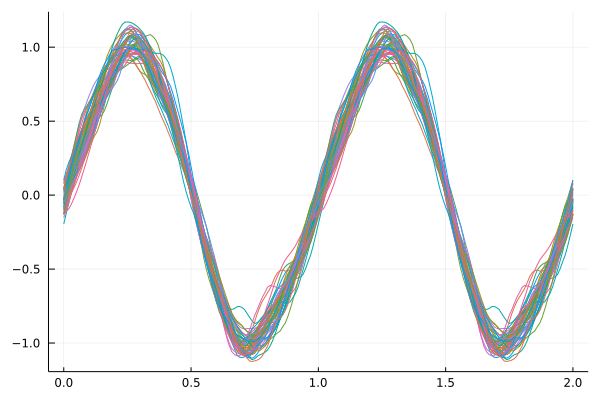

In [ ]:
# sample 10 times from posterior
p=plot()
x = 0.0:0.01:2
for k in 1:50
f = rand(postΠ)
y = f.(x)
plot!(p,x,y,show=true, legend=false)
end
p

LoadError: ignored

In [ ]:
fullmat = zeros(Float64, 101, 50)
for i in 1:10
  fullmat[:,i] = p[1][i][:y]
end 
fullmat;


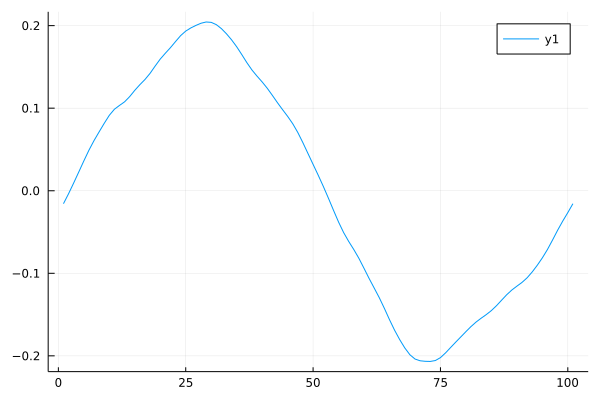

In [ ]:
means = zeros(Float64, 101, 1)
for i in 1:101
means[i] = mean(fullmat[i,:])
end
means;
plot(means)

In [ ]:
2*pi*postΠ.distribution.mean

50-element Vector{Float64}:
 -0.1997941532377626
  0.018214123443261763
  0.0005384856305597254
  0.00042394594597644465
 -1.935628384988081e-5
  8.379002566296255e-6
 -1.185965744703588e-5
  4.324873064978447e-6
  2.4171856863043096e-6
  8.492299785267389e-7
  1.5686084222077657e-6
 -5.5750814050027454e-8
  9.07263205297353e-7
  ⋮
 -4.913250021670373e-9
 -2.886141298217582e-8
  3.5573450907413757e-9
  8.212111345596381e-9
  3.470982782018619e-9
 -1.7158084872398602e-9
 -6.8332910518602084e-9
  1.506206602656202e-9
  3.018628213411153e-9
  1.3730101911777838e-9
  2.725194455102729e-9
 -9.91300418054433e-10

In [ ]:
postΠ.distribution.var

50×50 Matrix{Float64}:
  8.98805e-5   -3.18453e-8   -3.24752e-8   …   1.90857e-14   2.19932e-14
 -3.18453e-8    6.20627e-6   -2.91278e-9       5.95853e-16   1.35745e-15
 -3.24752e-8   -2.91278e-9    1.23286e-6       5.23826e-16   1.32505e-16
  1.34502e-8   -8.15342e-10  -6.68392e-12     -8.01754e-17   1.84853e-16
 -5.44101e-11  -6.11113e-11  -6.16031e-11     -6.31127e-17   1.189e-17
  3.63358e-10   7.66832e-13   3.64254e-11  …  -1.30945e-17   2.19708e-17
 -7.26245e-11   5.81098e-13  -2.82427e-13     -5.27816e-18   2.01198e-17
  2.57418e-12  -3.3247e-12    2.08416e-12      1.44411e-19   5.86831e-18
 -2.93513e-12   7.09692e-13  -3.67689e-13     -3.19698e-18   1.03604e-18
  1.49724e-11   4.92306e-13   1.55683e-13     -2.72436e-18  -1.24645e-19
 -1.34644e-13   6.45325e-13   8.27599e-14  …  -2.84608e-18   1.80442e-19
  5.15678e-12  -7.05631e-14   1.64443e-14     -1.17992e-18   8.9629e-20
  3.77732e-12   2.28046e-13   1.49854e-14     -1.63974e-18   7.82393e-19
  ⋮                            

#Credible Bands

In [ ]:
  Pkg.add("Turing")
  using Turing
  using StatsPlots
  using Plots


   Resolving package versions...
   Installed InplaceOps ───────────────── v0.3.0
   Installed Crayons ──────────────────── v4.0.4
   Installed Hwloc_jll ────────────────── v2.4.1+0
   Installed RecursiveArrayTools ──────── v2.11.4
   Installed ConsoleProgressMonitor ───── v0.1.2
   Installed BangBang ─────────────────── v0.3.30
   Installed InitialValues ────────────── v0.2.10
   Installed ArgCheck ─────────────────── v2.1.0
   Installed CommonSolve ──────────────── v0.2.0
   Installed Baselet ──────────────────── v0.1.1
   Installed Libtask ──────────────────── v0.5.2
   Installed FiniteDiff ───────────────── v2.8.0
   Installed AdvancedHMC ──────────────── v0.2.27
   Installed Transducers ──────────────── v0.4.65
   Installed StatisticalTraits ────────── v1.1.0
   Installed AbstractPPL ──────────────── v0.1.4
   Installed Bijectors ────────────────── v0.9.4
   Installed IfElse ───────────────────── v0.1.0
   Installed ArrayInterface ───────────── v3.1.17
   Installed SLEEFPirates ──

LoadError: ignored

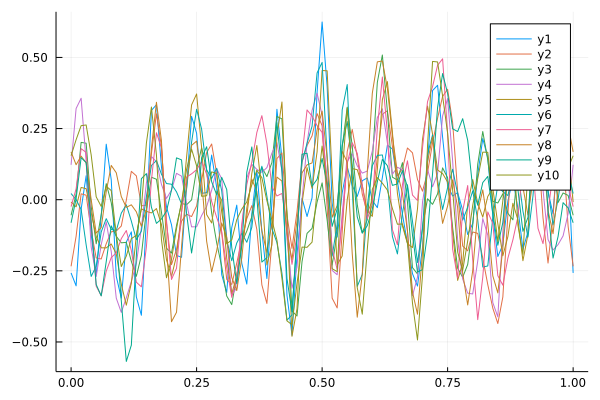

In [ ]:
# sample 10 times from posterior
p=plot()
x = 0.0:0.01:1.0
for k in 1:10
f = rand(postΠ)
y = f.(x)
z = mean(y)
plot!(p,x,y,show=true)
end
p

In [ ]:
p[1][1][:y]

101-element Vector{Float64}:
 -0.25750846741561567
 -0.3028727337145629
 -0.033673508764308774
  0.08414893652766028
 -0.12145993471104183
 -0.2647893604989603
 -0.05583591984321382
  0.19498590806001848
  0.069584985337061
 -0.26962106704076033
 -0.3461051513563241
 -0.14899464100107804
 -0.11318016037330103
  ⋮
 -0.030154168872487584
 -0.17419118370168307
 -0.11363082905570572
  0.18416239187521813
  0.422540740790999
  0.32222704499445565
  0.02692997125506416
 -0.049845268350153
  0.18961476401968744
  0.3522382708826085
  0.11850572178343428
 -0.25750846741561567

In [ ]:
fullmat = zeros(Float64, 629, 10)

for i in 1:10
  fullmat[:,i] = p[1][i][:y]
end 
fullmat

629×10 Matrix{Float64}:
 0.557654   0.160722    -0.422674  …   0.134348    0.236713   0.499494
 0.575276   0.182614    -0.405214      0.149231    0.252219   0.52191
 0.593106   0.204223    -0.387525      0.164112    0.267256   0.543705
 0.611219   0.225549    -0.369578      0.179014    0.281887   0.564793
 0.629674   0.246599    -0.351336      0.193953    0.296188   0.585104
 0.648517   0.26738     -0.332752  …   0.208937    0.310247   0.604587
 0.66777    0.2879      -0.313772      0.223966    0.324157   0.623208
 0.687435   0.308167    -0.294338      0.23903     0.338016   0.640959
 0.707489   0.328186    -0.274392      0.254113    0.351916   0.657851
 0.727886   0.347963    -0.253873      0.269189    0.365945   0.673917
 0.748555   0.367498    -0.232728  …   0.284228    0.380182   0.689209
 0.769404   0.386789    -0.210906      0.299193    0.394691   0.703796
 0.790324   0.40583     -0.188369      0.314047    0.409518   0.717759
 ⋮                                 ⋱                  

##Computing the means 

In [ ]:
means = zeros(Float64, 629, 1)
for i in 1:629
means[i] = mean(fullmat[i,:])
end

means

629×1 Matrix{Float64}:
  0.14723101000712435
  0.16577455915599598
  0.1841632157480409
  0.20241301859319666
  0.22054231097326524
  0.23857077290717515
  0.25651843002545116
  0.27440468108916843
  0.2922473842453256
  0.3100620383616001
  0.3278610904439857
  0.34565339349749824
  0.36344383158591415
  ⋮
 -0.07364376796874375
 -0.05360095401982427
 -0.03357834938347539
 -0.013610022057843868
  0.006272522948647818
  0.02604125503699294
  0.04567239480070382
  0.06514702336876013
  0.08445149915155181
  0.10357766558649488
  0.1225228429077787
  0.1412896066074603

##Matrix of absolute values of samples and mean of samples

In [ ]:
broadcast(abs,fullmat[2,:]-ones(101)means[2])


LoadError: ignored

LoadError: ignored

##Finding the supremum

In [ ]:
supremum = zeros(Float64, 101, 1)

  for j in 1:101
    supremum[j] = findmax(Float64 , absolute[j,1:10])[1]
 end 

supremum





101×1 Matrix{Float64}:
 0.1338503920658644
 0.14885439806378048
 0.22033717473926612
 0.2518213828718075
 0.23162161154971328
 0.18917925397155372
 0.20477723806842352
 0.23738319821351334
 0.20607493704866003
 0.21853430148065223
 0.19658396761379915
 0.15713564301818161
 0.19747956150735863
 ⋮
 0.2860227901491603
 0.2584020249313046
 0.21318677104353612
 0.210345462934455
 0.235777740651112
 0.21726980793928063
 0.16848414046003507
 0.17028163800350743
 0.15318635179954104
 0.105150240466731
 0.12663800124034924
 0.1338503920658644

##Saving position cordinates for supremum

In [ ]:
A = absolute[1,:]
S = Set([1,2,3,4,5,6,7,8,9,10])
supcord = zeros(Float64, 101, 1)
B = [if i in S A[i] else 0 end for i in 1:length(A)]

S = Set([1,2,3,4,5,6,7,8,9,10])
for i in 1:101
  A = absolute[i,:]
  B = [if i in S A[i] else 0 end for i in 1:length(A)]
  supcord[i] = argmax(B)
 end 
 supcord


jul = hcat(supremum, supcord, [1.0:1:101;])
jul

LoadError: ignored

In [ ]:
function sortrows(M, by=zeros(0))
    if by == zeros(0)
        order = copy(M)
    else
        order = copy(by)
    end
    if size(order,2) > 1
        order = Float64.(order.-minimum(order, dims = 1))
        order = (order./maximum(order,dims=1))*(10).^(size(order,2):-1:1)
    end
    order = sortperm(order[:,1])
    return M[order,:], order
end

sorted_A, order = sortrows(jul,jul[:,[1]])
sorted_A

101×3 Matrix{Float64}:
 0.0760217  4.0  56.0
 0.0832919  3.0  57.0
 0.093121   6.0  65.0
 0.0963624  8.0  60.0
 0.0994952  9.0  42.0
 0.102748   4.0  62.0
 0.10515    2.0  99.0
 0.112519   1.0  36.0
 0.113277   8.0  61.0
 0.114377   4.0  35.0
 0.11771    3.0  59.0
 0.118917   4.0  63.0
 0.119592   3.0  58.0
 ⋮               
 0.242093   4.0  51.0
 0.242853   4.0  52.0
 0.243176   8.0  14.0
 0.245668   5.0  72.0
 0.246484   2.0  89.0
 0.247299   5.0  17.0
 0.251821   5.0   4.0
 0.255526   4.0  16.0
 0.258402   2.0  91.0
 0.261399   4.0  15.0
 0.263205   5.0  71.0
 0.286023   2.0  90.0

In [ ]:
##Extraxt the 96 smallest values
sorted_A[1:96,:]

96×3 Matrix{Float64}:
 0.0760217  4.0  56.0
 0.0832919  3.0  57.0
 0.093121   6.0  65.0
 0.0963624  8.0  60.0
 0.0994952  9.0  42.0
 0.102748   4.0  62.0
 0.10515    2.0  99.0
 0.112519   1.0  36.0
 0.113277   8.0  61.0
 0.114377   4.0  35.0
 0.11771    3.0  59.0
 0.118917   4.0  63.0
 0.119592   3.0  58.0
 ⋮               
 0.228756   9.0  84.0
 0.230705   5.0  18.0
 0.231622   5.0   5.0
 0.235778   7.0  94.0
 0.237383   6.0   8.0
 0.242093   4.0  51.0
 0.242853   4.0  52.0
 0.243176   8.0  14.0
 0.245668   5.0  72.0
 0.246484   2.0  89.0
 0.247299   5.0  17.0
 0.251821   5.0   4.0

In [ ]:
function drop(M::AbstractMatrix;
                     r=nothing,
                     c=nothing)
           s = size(M)
           dr = collect(1:s[1])
           dc = collect(1:s[2])
           isnothing(r) ? nothing : splice!(dr,r)
           isnothing(c) ? nothing : splice!(dc,c)
           M[dr,dc]
       end
newjul = drop(sorted_A[1:96,:], c=1)

96×2 Matrix{Float64}:
 4.0  56.0
 3.0  57.0
 6.0  65.0
 8.0  60.0
 9.0  42.0
 4.0  62.0
 2.0  99.0
 1.0  36.0
 8.0  61.0
 4.0  35.0
 3.0  59.0
 4.0  63.0
 3.0  58.0
 ⋮    
 9.0  84.0
 5.0  18.0
 5.0   5.0
 7.0  94.0
 6.0   8.0
 4.0  51.0
 4.0  52.0
 8.0  14.0
 5.0  72.0
 2.0  89.0
 5.0  17.0
 5.0   4.0

In [ ]:
B = zeros(Int64,96,2)
for i = 1:96
      for j = 1:2
        B[i,j] = convert(Int64,newjul[i,j])
    end
end
B = view(B, :, [2,1])

96×2 view(::Matrix{Int64}, :, [2, 1]) with eltype Int64:
 56  4
 57  3
 65  6
 60  8
 42  9
 62  4
 99  2
 36  1
 61  8
 35  4
 59  3
 63  4
 58  3
  ⋮  
 84  9
 18  5
  5  5
 94  7
  8  6
 51  4
 52  4
 14  8
 72  5
 89  2
 17  5
  4  5

##Now that we have the position of the supremum, will sort the values from smallest to largest.

In [ ]:
fullmat[B[1,1],:]


10-element Vector{Float64}:
 0.878939060467516
 0.8155438267716394
 0.7789269586912331
 0.712218288221991
 0.9183400776872038
 0.9039744505901859
 0.9157596114997407
 0.8958884419799684
 0.7346882754410341
 0.8792354958959394

In [ ]:
fullmat[B[1,1],B[1,2]]
fullmat[B[2,1],B[2,2]]

functions = zeros(96,10)
for i in 1:96
functions[i,:] = fullmat[B[i,1],:]
end

functions

96×10 Matrix{Float64}:
 -0.320837   -0.36837      -0.371404   …  -0.258811   -0.264531   -0.315428
 -0.390084   -0.439742     -0.496918      -0.366492   -0.373253   -0.384976
 -0.755271   -0.802987     -0.755112      -0.843195   -0.735969   -0.862231
 -0.609003   -0.593217     -0.721565      -0.728726   -0.570519   -0.682099
  0.625878    0.653657      0.625917       0.746337    0.814966    0.646092
 -0.737509   -0.629594     -0.772559   …  -0.800111   -0.715922   -0.655786
 -0.140068   -0.306239     -0.155302      -0.295064   -0.122674   -0.154119
  0.764472    0.899637      0.895389       0.819254    0.98429     0.794805
 -0.670727   -0.611687     -0.73862       -0.783736   -0.640461   -0.65066
  0.746268    0.907316      0.90534        0.793189    0.954733    0.830774
 -0.548109   -0.549222     -0.696544   …  -0.618603   -0.512289   -0.650367
 -0.783982   -0.685229     -0.802158      -0.817051   -0.766778   -0.733606
 -0.472613   -0.494271     -0.621757      -0.486425   -0.45309    

##Now taking out our means

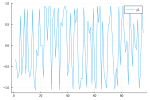

In [ ]:
meanfunctions = zeros(96)
for i in 1:96
meanfunctions[i] = means[B[i,1]]
end

plot(meanfunctions)

##Defining the functions $F_{L}$ and $F_{H}$

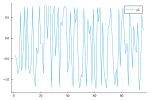

In [ ]:

mini = zeros(96,1)
for i in 1:96
mini[i] = minimum(functions[i,:])
end
mini
plot(mini)  

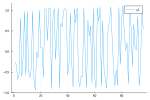

In [ ]:
maxi = zeros(96,1)
for i in 1:96
maxi[i] = maximum(functions[i,:])
end
maxi
plot(maxi) 

##The upper value is then 1.3976137131151722

In [ ]:
hcat(maxi,mini)

96×2 Matrix{Float64}:
 -0.258811   -0.404132
 -0.334835   -0.496918
 -0.676974   -0.862231
 -0.543437   -0.728726
  0.814966    0.625878
 -0.607308   -0.804957
 -0.111059   -0.306239
  0.98429     0.764472
 -0.573511   -0.783736
  0.972687    0.746268
 -0.473322   -0.696544
 -0.631157   -0.866878
 -0.396642   -0.621757
  ⋮          
 -0.78609    -1.16095
  1.00646     0.629972
  0.605563    0.231599
 -0.357193   -0.736688
  0.664992    0.289157
  0.0820144  -0.245578
  0.0382967  -0.342305
  0.850565    0.378466
 -0.832202   -1.26534
 -0.443364   -0.874908
  1.03028     0.571918
  0.551901    0.180723

#Plotting the bands

##Extracting the values from our matrix

In [ ]:
functions[:,1]

96-element Vector{Float64}:
  0.878939060467516
  0.05317732410989966
 -0.8336788008930878
 -0.4189223572815922
 -0.9137739285512927
 -1.0538412664824914
 -0.6924615518760008
  0.9407944303376352
 -1.0588119381082985
  0.908359547900924
  0.4297386528793282
  0.7860120179095771
 -0.6278406946723937
  ⋮
  0.49517904793364065
 -0.57924887135972
 -0.08331087705903158
 -0.579687053269002
 -0.8018621997117688
  0.41013102067897644
 -1.1068947271216019
  0.023404964950474366
 -1.3490082661053977
 -0.41496403929205716
 -0.0820447759411221
 -0.3278844079464493

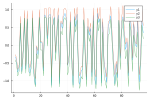

In [ ]:

plot([meanfunctions,maxi,mini])

plot([functions[:,1],maxi,mini])


##Implementation of prior on our data

#Data 

In [14]:
using DelimitedFiles

data = DelimitedFiles.readdlm("data_set.txt", '\n',  ' ')


4000000×1 Matrix{Float64}:
 0.099379
 0.099227
 0.099389
 0.100072
 0.101562
 0.105415
 0.110546
 0.117387
 0.124877
 0.130922
 0.136363
 0.143161
 0.149525
 ⋮
 2.229048
 2.220472
 2.214372
 2.209748
 2.203678
 2.196471
 2.18899
 2.181757
 2.174811
 2.168101
 2.158343
 2.145778

##Data augmentation

In [15]:
dataaug= data[1:1000:4000000];
dataaug= pi*ones(4000)+dataaug;

In [17]:
dataaug= data[1:1000:4000000];
dataaug= pi*ones(4000)+dataaug;
dataaug=dataaug/(2*pi);

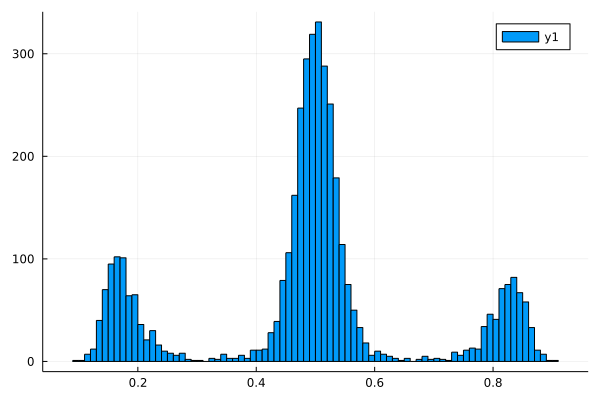

In [18]:
histogram(dataaug)

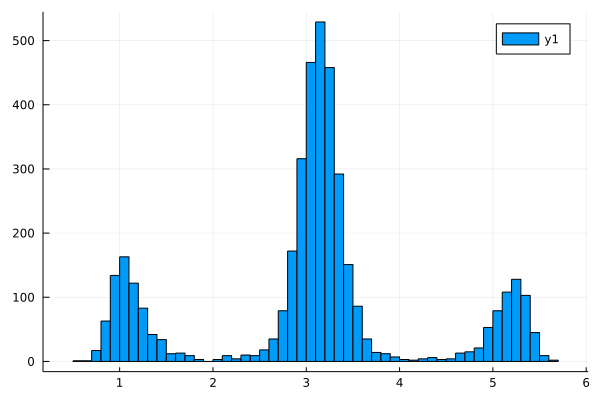

In [ ]:
histogram(dataaug)

In [ ]:
increment = dataaug[2:end]-dataaug[1:end-1];

In [ ]:
sumsquaredincremnets = sum(increment.^2)

1126.994250627245

In [ ]:
1/4*sum(increment.^2)

281.74856265681126

In [ ]:
sqrt(1/4*sum(increment.^2))

16.785367516286655

In [ ]:
u = 4/sumsquaredincremnets

0.0035492638917844896

In [ ]:
timeinterval = range(0.0, stop=sumsquaredincremnets, length=length(dataaug))

0.0:0.28181901741116405:1126.994250627245

In [ ]:
X = SamplePath(timeinterval, dataaug)

SamplePath{StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}}, Vector{Float64}}(0.0:0.28181901741116405:1126.994250627245, [3.240971653589793, 3.146064653589793, 3.1200056535897933, 3.399667653589793, 3.4180336535897933, 3.3380566535897933, 3.1309156535897933, 3.295868653589793, 3.501052653589793, 3.0730226535897933  …  2.938939653589793, 3.068692653589793, 3.457357653589793, 1.2552526535897932, 1.0082686535897931, 2.151993653589793, 3.323408653589793, 3.1622326535897933, 3.349819653589793, 5.077528653589793])

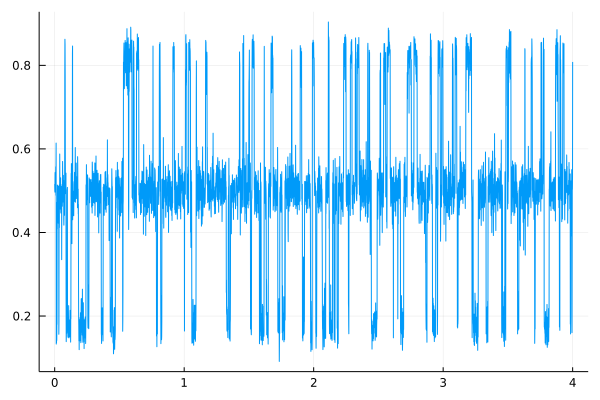

In [ ]:
plot(X.timeinterval, X.samplevalues, legend=false)

In [ ]:
alpha = 1.5; eta = 0.02;

In [ ]:
s = 1/sqrt(eta);

###Random scaling

In [ ]:
4^(-1.5/(1+(2*1.5)))

0.5946035575013605

In [ ]:
QR = Exponential(1)
l = (rand(QR,1).^(0.5+1.5))/sqrt(4)
l = 0.5339623845266052

0.5339623845266052

In [ ]:
QR = Exponential(4^(1/(1+log(2))))
l = mean(rand(QR,100))

2.2352541479924533

In [ ]:
const scalingconstant = 1/sqrt(2*pi);

In [ ]:
sinf = [x -> scalingconstant*sin(k*x) for k in 1:50];

In [ ]:
cosf = [x -> scalingconstant*cos(k*x) for k in 1:50];

In [ ]:
sincosmixed = [if isodd(k) sinf[div((k-1),2)] else cosf[div(k,2)] end for k in 2:101];

In [ ]:
#basis = vcat(x -> 1.0, sincosmixed)
basis = sincosmixed;

In [ ]:
model = SDEModel(1.0, dataaug[1], sumsquaredincremnets, 0.01)

SDEModel{Float64}(1.0, 3.240971653589793, 1126.994250627245, 0.01)

In [ ]:
#levels = vcat(1.0 [if isodd(k) div((k-1), 2) else div(k,2) end for k in 2:101]);
levels = [if isodd(k) div((k-1), 2) else div(k,2) end for k in 2:101];

In [ ]:
standarddeviations = s*levels.^(-2.0)

100-element Vector{Float64}:
 7.0710678118654755
 7.0710678118654755
 1.7677669529663689
 1.7677669529663689
 0.7856742013183862
 0.7856742013183862
 0.4419417382415922
 0.4419417382415922
 0.282842712474619
 0.282842712474619
 0.19641855032959654
 0.19641855032959654
 0.14430750636460152
 ⋮
 0.0034918853391928276
 0.0034918853391928276
 0.0033417144668551396
 0.0033417144668551396
 0.003201026623750781
 0.003201026623750781
 0.003069039848899946
 0.003069039848899946
 0.002945051150297991
 0.002945051150297991
 0.0028284271247461905
 0.0028284271247461905

In [ ]:
D = Diagonal(standarddeviations);

In [ ]:
Pkg.add("Distributions");
using Distributions;

In [ ]:
distribution = GaussianVector(sparse(Diagonal(s*[sqrt(1/((2*pi*(ceil(k/2)^2))^(alpha+0.5))+1/(1^(alpha+0.5))) for k in 1:50.0])));

In [ ]:
distribution = GaussianVector(sparse(Diagonal([s*(k^(-0.5-1.5)) for k in 1:100.0])));

In [ ]:
Π = GaussianProcess([basis[k] for k in 1:100], distribution);

In [ ]:
# sample 10 times from Gaussian process
p=plot()
x = 0.0:0.01:2*pi
for k in 1:10
f = rand(Π)
y = f.(x)
plot!(p,x,y,show=true, legend = false)
end
p;

In [ ]:
postΠ = calculateposterior(Π, X, model);

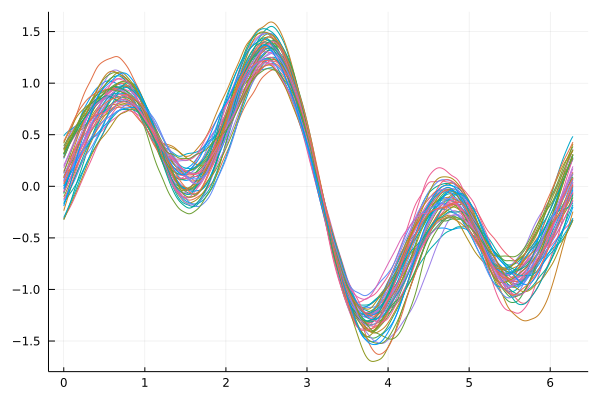

In [ ]:
# sample 50 times from posterior
p=plot()
x = 0.0:0.01:2*pi
for k in 1:50
f = rand(postΠ)
y = f.(x)
plot!(p,x,y,show=true, legend = false)
end
p

In [ ]:
kuk = GaussianVector(zeros(100), s*postΠ.distribution.var);

In [ ]:
Π = GaussianProcess([basis[k] for k in 1:100], kuk);

In [ ]:
postΠ = calculateposterior(Π, X, model);

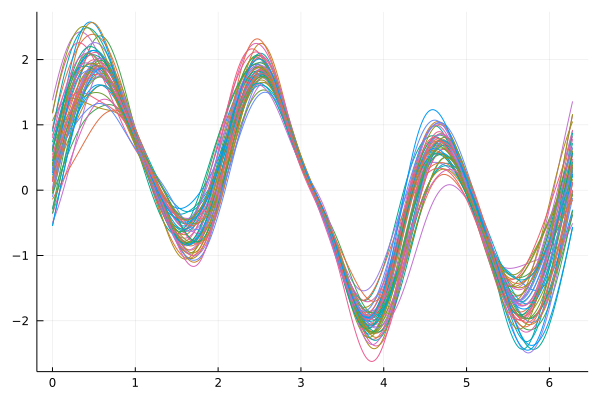

In [ ]:
# sample 50 times from posterior
q=plot()
x = 0.0:0.01:2*pi
for k in 1:50
f = rand(postΠ)
y = f.(x)
plot!(q,x,y,show=true, legend = false)
end
q

##Confidence bands

In [ ]:
fullmat1 = zeros(Float64, 629, 50)
for i in 1:50
  fullmat1[:,i] = q[1][i][:y]
end 
fullmat1;

In [ ]:
means1 = zeros(Float64, 629, 1)
for i in 1:629
means1[i] = mean(fullmat1[i,:])
end
means1;

##Random scaling

In [ ]:
fullmat = zeros(Float64, 629, 50)
for i in 1:50
  fullmat[:,i] = p[1][i][:y]
end 
fullmat;



In [ ]:
means = zeros(Float64, 629, 1)
for i in 1:629
means[i] = mean(fullmat[i,:])
end
means;


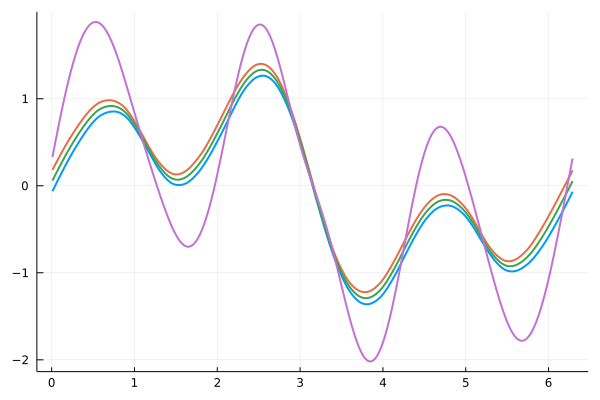

In [ ]:
var1 = zeros(Float64, 629, 50)
for i in 1:629
  for j in 1:50
var1[i,j] = (fullmat[i,j]-means[i]).^2
  end
end

var2 = zeros(Float64, 629, 1)
for i in 1:629
var2[i] = sum(var1[i,:])/50
end

balle = means-((var2.^(0.5))*0.47);
bolle = means+((var2.^(0.5))*0.47);

y = [balle  bolle  means means1]
x = 1:629
plot(x/100, y,lw = 2, legend = false)

##Naive approch to find $\sigma^2$ and $\theta^2$

In [ ]:
Pkg.add("Distributions")

   Resolving package versions...
    Updating `~/.julia/environments/v1.6/Project.toml`
  [31c24e10] + Distributions v0.24.18
  No Changes to `~/.julia/environments/v1.6/Manifest.toml`
Precompiling project...
  ? ArrayLayouts
  ? ElasticPDMats
  ? ChainRules
  ? VectorizationBase
  ? FastGaussQuadrature
  ? AbstractGPs
  ? BlockArrays
  ? SLEEFPirates
  ? LoopVectorization
  ? Zygote
  ? RecursiveFactorization
  ? Stheno
  ? GaussianProcesses


In [ ]:
using Distributions

In [ ]:
sigmasq = zero(1)
for i in 1:3999
sigmasq = 1/4*sum((dataaug[(i+1)]-dataaug[i])^2)
end
sigmasq
u = 3.549*(10^-3)
radsq = sigmasq*u/(10^-3)

histogram(dataaug*radsq)
sigmasq

0.3024415434879573

In [ ]:
musq = zero(1)
for i in 1:3999
musq = sum((dataaug[(i+1)]-dataaug[i])^2)
end
musq

2.9849783886810006

In [ ]:
# implement SDE dX_t=sin(2\pi X_t)dt+dW_t, 
# starting at zero till time 1000.0, discretised 
# with precision 0.01.
model = SDEModel(1.0,0.0,4000.0,0.01)

SDEModel{Float64}(1.0, 0.0, 4000.0, 0.01)

In [ ]:
# Sample from sde.
X = rand(sde)

SamplePath{StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}}, Vector{Float64}}(0.0:0.01:1000.0, [0.0, -0.15043414045071976, -0.09382118395756411, 0.10126384089259181, 0.1268131707911481, 0.06935688864185821, 0.03507949783759154, 0.003469106400470677, -0.04322329769347376, -0.04175556894553242  …  -34.6341280006308, -34.72358055414711, -34.81825965754906, -34.84304423340551, -34.74331254341885, -34.71324591792026, -34.73619042216207, -34.725952660149446, -34.67463881532064, -34.79515302031127])

In [ ]:
distribution = GaussianVector(sparse(Diagonal([k^(-1/2-0.4) for k in 1.0:50.0])))

GaussianVector{SparseVector{Float64, Int64}, SparseMatrixCSC{Float64, Int64}, SparseMatrixCSC{Float64, Int64}}(50-element SparseVector{Float64, Int64} with 0 stored entries, 
⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑, 
⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑, 50, 50)

In [ ]:
Π = GaussianProcess([fourier(k) for k in 1:50], distribution)

# sample 5 times from prior
p=plot()
x = 0.0:0.01:1
for k in 1:5
f = rand(Π)
y = f.(x)
plot!(p,x,y,show=true)
end
p

Couldn't find a suitable web browser!
Set the BROWSER environment variable to your desired browser.
/usr/bin/xdg-open: 851: /usr/bin/xdg-open: www-browser: not found
/usr/bin/xdg-open: 851: /usr/bin/xdg-open: links2: not found
/usr/bin/xdg-open: 851: /usr/bin/xdg-open: elinks: not found
/usr/bin/xdg-open: 851: /usr/bin/xdg-open: links: not found
/usr/bin/xdg-open: 851: /usr/bin/xdg-open: lynx: not found
/usr/bin/xdg-open: 851: /usr/bin/xdg-open: w3m: not found
xdg-open: no method available for opening '/tmp/jl_hEQuJ2.html'


LoadError: ignored

In [ ]:
#Naive apporach
dataaug= data[1:1000:4000000]
musq = zero(1)
for i in 1:3999
musq = (51/4)*(sum((dataaug[(i+1)]-dataaug[i])^2)/sum(dataaug))
end
musq

-0.1732482611838648

In [ ]:
# implement SDE dX_t=sin(2\pi X_t)dt+dW_t, 
# starting at zero till time 1000.0, discretised 
# with precision 0.01.
model = SDEModel(1.0,0.0,1000.0,0.01)

SDEModel{Float64}(1.0, 0.0, 1000.0, 0.01)

In [ ]:
sde = SDE(x->-sinpi(2*x),model)
# Sample from sde.
X = rand(sde)


SamplePath{StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}}, Vector{Float64}}(0.0:0.01:1000.0, [0.0, 0.17231626054410784, 0.15347647665080896, 0.2804828210932997, 0.3128734648823125, 0.17006302591251285, 0.2035522734253094, 0.12566116216562423, 0.0961754906523423, 0.05050253373444757  …  23.961261896958835, 23.902475867990496, 23.88826784853805, 23.707947746234474, 23.611932643738136, 23.690275692830365, 23.637784395055917, 23.826529481733882, 23.88792500153019, 23.91245263737778])

In [ ]:
# Plot X. 
using Plots # Plots package in Julia. 
plot(X.timeinterval, X.samplevalues)

##Data augmantation as discribed in mulen, zanten. Keeping each 50`s timestep

##Making some changes to the data(Subsampling)

In [ ]:
postΠ = calculateposterior(Π, X, model)

GaussianProcess{Vector{Function}, GaussianVector{Vector{Float64}, Symmetric{Float64, Matrix{Float64}}, Matrix{Float64}}}(Function[BayesianNonparametricStatistics.var"#1#3"{Int64, Float64}(1, 1.4142135623730951), BayesianNonparametricStatistics.var"#2#4"{Int64, Float64}(2, 1.4142135623730951), BayesianNonparametricStatistics.var"#1#3"{Int64, Float64}(3, 1.4142135623730951), BayesianNonparametricStatistics.var"#2#4"{Int64, Float64}(4, 1.4142135623730951), BayesianNonparametricStatistics.var"#1#3"{Int64, Float64}(5, 1.4142135623730951), BayesianNonparametricStatistics.var"#2#4"{Int64, Float64}(6, 1.4142135623730951), BayesianNonparametricStatistics.var"#1#3"{Int64, Float64}(7, 1.4142135623730951), BayesianNonparametricStatistics.var"#2#4"{Int64, Float64}(8, 1.4142135623730951), BayesianNonparametricStatistics.var"#1#3"{Int64, Float64}(9, 1.4142135623730951), BayesianNonparametricStatistics.var"#2#4"{Int64, Float64}(10, 1.4142135623730951)  …  BayesianNonparametricStatistics.var"#1#3"{Int6

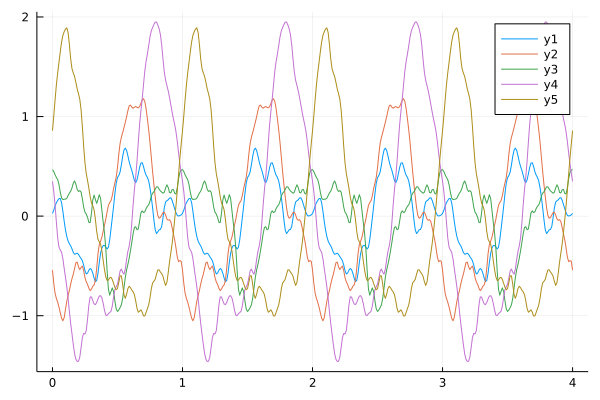

In [ ]:
# sample 5 times from prior
p=plot()
x = 0.0:0.01:4
for k in 1:5
f = rand(Π)
y = f.(x)
plot!(p,x,y,show=true)
end
p

In [ ]:
postΠ = calculateposterior(Π, X, model)

GaussianProcess{Vector{Function}, GaussianVector{Vector{Float64}, Symmetric{Float64, Matrix{Float64}}, Matrix{Float64}}}(Function[BayesianNonparametricStatistics.var"#1#3"{Int64, Float64}(1, 1.4142135623730951), BayesianNonparametricStatistics.var"#2#4"{Int64, Float64}(2, 1.4142135623730951), BayesianNonparametricStatistics.var"#1#3"{Int64, Float64}(3, 1.4142135623730951), BayesianNonparametricStatistics.var"#2#4"{Int64, Float64}(4, 1.4142135623730951), BayesianNonparametricStatistics.var"#1#3"{Int64, Float64}(5, 1.4142135623730951), BayesianNonparametricStatistics.var"#2#4"{Int64, Float64}(6, 1.4142135623730951), BayesianNonparametricStatistics.var"#1#3"{Int64, Float64}(7, 1.4142135623730951), BayesianNonparametricStatistics.var"#2#4"{Int64, Float64}(8, 1.4142135623730951), BayesianNonparametricStatistics.var"#1#3"{Int64, Float64}(9, 1.4142135623730951), BayesianNonparametricStatistics.var"#2#4"{Int64, Float64}(10, 1.4142135623730951)  …  BayesianNonparametricStatistics.var"#1#3"{Int6

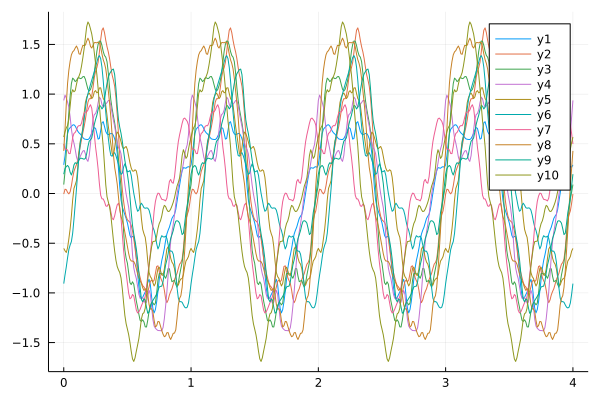

In [ ]:
# sample 10 times from posterior
p=plot()
x = 0.0:0.01:4
for k in 1:10
f = rand(postΠ)
y = f.(x)
plot!(p,x,y,show=true)
end
p

##Credible bands for data

In [ ]:
fullmat = zeros(Float64, 10000, 5)

for i in 1:5
  fullmat[:,i] = p[1][i][:y]
end 
fullmat

10000×5 Matrix{Float64}:
 0.366595  0.64209   0.482087  0.641263  0.53014
 0.365267  0.641134  0.481651  0.640245  0.530365
 0.366682  0.642153  0.482116  0.641329  0.530126
 0.372582  0.646403  0.484208  0.645705  0.529095
 0.385001  0.655415  0.489534  0.654139  0.526784
 0.413285  0.676881  0.507893  0.668978  0.521193
 0.440121  0.701371  0.539926  0.675017  0.51709
 0.457091  0.728884  0.584716  0.667244  0.521428
 0.463136  0.757059  0.62085   0.651338  0.540524
 0.472359  0.781612  0.639448  0.63887   0.566971
 0.492129  0.807412  0.656354  0.62996   0.600281
 0.536074  0.848221  0.689876  0.625846  0.656786
 0.593463  0.897701  0.736744  0.635507  0.725009
 ⋮                                       
 0.910678  1.10694   1.17795   0.999427  1.00473
 0.966847  1.12592   1.17888   1.02393   0.960695
 1.01126   1.13491   1.17729   1.03798   0.922967
 1.04584   1.13846   1.17657   1.04582   0.891551
 1.07626   1.14001   1.17763   1.05036   0.862742
 1.09686   1.14429   1.17929   1.051

#Means

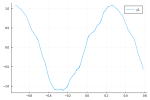

In [ ]:
means = zeros(Float64, 4000, 1)
for i in 1:4000
means[i] = mean(fullmat[i,:])
end

plot(data[1:4000],means)

##Absolute value

In [ ]:
absolute = zeros(Float64, 100, 10)
for i in 1:100
absolute[i,:] = broadcast(abs,fullmat[i,:]-ones(10)means[i])
end
absolute

100×10 Matrix{Float64}:
 0.0386425    0.0908799   0.00351682  …  0.0182405   0.197599    0.190218
 0.0392005    0.0900188   0.00398469     0.0183934   0.197841    0.190362
 0.0386056    0.0909367   0.00348587     0.0182302   0.197583    0.190209
 0.036004     0.0948829   0.00132255     0.0174567   0.196413    0.189464
 0.0298789    0.103843    0.00373492     0.0153648   0.193396    0.187241
 0.0125166    0.127929    0.0189113   …  0.00864966  0.182848    0.177103
 0.00841136   0.156682    0.0432592      0.00146597  0.163973    0.152899
 0.0197901    0.177208    0.0801213      0.00372441  0.13472     0.104989
 0.00508722   0.170242    0.11942        0.023736    0.103007    0.0450482
 0.0166097    0.150606    0.145207       0.0468079   0.0789573   0.000528759
 0.0303863    0.133688    0.162256    …  0.0672931   0.0578533   0.0342385
 0.028164     0.125608    0.176723       0.0892797   0.0320954   0.0722988
 0.00704925   0.134052    0.186426       0.106573    0.0107401   0.103491
 ⋮      

##Absolute value

In [ ]:
supremum = zeros(Float64, 100, 1)

  for j in 1:100
    supremum[j] = findmax(Float64 , absolute[j,1:10])[1]
 end 

supremum


100×1 Matrix{Float64}:
 0.19759905449313225
 0.1978406209998349
 0.1975829259000355
 0.19641260585989234
 0.19339559916640447
 0.18284779713711413
 0.19975701655619882
 0.22740063880484784
 0.23342271352874144
 0.226457025086494
 0.21864012178916659
 0.21216750780252414
 0.20568876447147788
 ⋮
 0.11989093522916994
 0.18489729883424733
 0.24237239142572253
 0.3382614078203172
 0.32241880109004484
 0.2471797823700832
 0.21361256979928722
 0.2430633645238338
 0.16217921159659732
 0.18256350822768497
 0.1803354782670657
 0.1730266328994292

##Saving position

In [ ]:
A = absolute[1,:]
S = Set([1,2,3,4,5,6,7,8,9,10])
supcord = zeros(Float64, 100, 1)
B = [if i in S A[i] else 0 end for i in 1:length(A)]

S = Set([1,2,3,4,5,6,7,8,9,10])
for i in 1:100
  A = absolute[i,:]
  B = [if i in S A[i] else 0 end for i in 1:length(A)]
  supcord[i] = argmax(B)
 end 
 supcord


jul = hcat(supremum, supcord, [1.0:1:100;])
jul

100×3 Matrix{Float64}:
 0.197599  9.0    1.0
 0.197841  9.0    2.0
 0.197583  9.0    3.0
 0.196413  9.0    4.0
 0.193396  9.0    5.0
 0.182848  9.0    6.0
 0.199757  6.0    7.0
 0.227401  6.0    8.0
 0.233423  6.0    9.0
 0.226457  6.0   10.0
 0.21864   6.0   11.0
 0.212168  6.0   12.0
 0.205689  6.0   13.0
 ⋮              
 0.119891  7.0   89.0
 0.184897  9.0   90.0
 0.242372  8.0   91.0
 0.338261  8.0   92.0
 0.322419  8.0   93.0
 0.24718   8.0   94.0
 0.213613  8.0   95.0
 0.243063  5.0   96.0
 0.162179  7.0   97.0
 0.182564  7.0   98.0
 0.180335  2.0   99.0
 0.173027  2.0  100.0

In [ ]:
function sortrows(M, by=zeros(0))
    if by == zeros(0)
        order = copy(M)
    else
        order = copy(by)
    end
    if size(order,2) > 1
        order = Float64.(order.-minimum(order, dims = 1))
        order = (order./maximum(order,dims=1))*(10).^(size(order,2):-1:1)
    end
    order = sortperm(order[:,1])
    return M[order,:], order
end

sorted_A, order = sortrows(jul,jul[:,[1]])
sorted_A

100×3 Matrix{Float64}:
 0.0677886  5.0  77.0
 0.0754484  7.0  53.0
 0.0769176  9.0  29.0
 0.0913956  9.0  52.0
 0.09167    7.0  28.0
 0.0924374  7.0  54.0
 0.0935561  7.0  27.0
 0.0949146  9.0  30.0
 0.102849   9.0  31.0
 0.10292    9.0  51.0
 0.118089   2.0  57.0
 0.119187   6.0  22.0
 0.119891   7.0  89.0
 ⋮               
 0.251363   2.0  48.0
 0.252243   2.0  34.0
 0.255531   7.0  73.0
 0.258511   8.0  40.0
 0.258722   8.0  43.0
 0.263205   2.0  70.0
 0.265691   8.0  41.0
 0.266624   8.0  42.0
 0.300745   7.0  71.0
 0.322419   8.0  93.0
 0.338261   8.0  92.0
 0.338638   7.0  72.0

##Extract 95.000 values

In [ ]:
##Extraxt the 95.000 smallest values
sorted_A[1:95,:]

95×3 Matrix{Float64}:
 0.0677886  5.0  77.0
 0.0754484  7.0  53.0
 0.0769176  9.0  29.0
 0.0913956  9.0  52.0
 0.09167    7.0  28.0
 0.0924374  7.0  54.0
 0.0935561  7.0  27.0
 0.0949146  9.0  30.0
 0.102849   9.0  31.0
 0.10292    9.0  51.0
 0.118089   2.0  57.0
 0.119187   6.0  22.0
 0.119891   7.0  89.0
 ⋮               
 0.244391   2.0  36.0
 0.247004   8.0  44.0
 0.24718    8.0  94.0
 0.249996   2.0  35.0
 0.250027   2.0  47.0
 0.251363   2.0  48.0
 0.252243   2.0  34.0
 0.255531   7.0  73.0
 0.258511   8.0  40.0
 0.258722   8.0  43.0
 0.263205   2.0  70.0
 0.265691   8.0  41.0

In [ ]:
function drop(M::AbstractMatrix;
                     r=nothing,
                     c=nothing)
           s = size(M)
           dr = collect(1:s[1])
           dc = collect(1:s[2])
           isnothing(r) ? nothing : splice!(dr,r)
           isnothing(c) ? nothing : splice!(dc,c)
           M[dr,dc]
       end
newjul = drop(sorted_A[1:95,:], c=1)

95×2 Matrix{Float64}:
 5.0  77.0
 7.0  53.0
 9.0  29.0
 9.0  52.0
 7.0  28.0
 7.0  54.0
 7.0  27.0
 9.0  30.0
 9.0  31.0
 9.0  51.0
 2.0  57.0
 6.0  22.0
 7.0  89.0
 ⋮    
 2.0  36.0
 8.0  44.0
 8.0  94.0
 2.0  35.0
 2.0  47.0
 2.0  48.0
 2.0  34.0
 7.0  73.0
 8.0  40.0
 8.0  43.0
 2.0  70.0
 8.0  41.0

In [ ]:
B = zeros(Int64,95,2)
for i = 1:95
      for j = 1:2
        B[i,j] = convert(Int64,newjul[i,j])
    end
end
B = view(B, :, [2,1])

95×2 view(::Matrix{Int64}, :, [2, 1]) with eltype Int64:
 77  5
 53  7
 29  9
 52  9
 28  7
 54  7
 27  7
 30  9
 31  9
 51  9
 57  2
 22  6
 89  7
  ⋮  
 36  2
 44  8
 94  8
 35  2
 47  2
 48  2
 34  2
 73  7
 40  8
 43  8
 70  2
 41  8

In [ ]:
functions = zeros(95,10)
for i in 1:95
functions[i,:] = fullmat[B[i,1],:]
end

functions

95×10 Matrix{Float64}:
 -0.484751  -0.454391   -0.432927   …  -0.525352  -0.498265  -0.561314
  0.952258   0.934346    0.925901       0.982547   0.849833   0.978886
  0.964895   0.936513    0.921118       0.981671   0.848226   0.980617
  0.978272   0.954359    0.896934       0.974291   0.836546   0.966167
  0.940143   0.938604    0.923152       0.979112   0.844982   0.972477
  0.937669   0.958705    0.904298   …   0.961944   0.81966    0.968614
  0.937058   0.957464    0.90542        0.963051   0.821306   0.968106
  0.978436   0.962013    0.887568       0.971763   0.832518   0.957989
  0.951476   1.01748     0.826974       0.961596   0.813612   0.889642
  0.958952   1.00673     0.837969       0.962569   0.816211   0.903558
  0.919712   0.841641    0.995942   …   1.0192     0.986553   1.04884
  0.911586   0.874271    0.982868       1.01291    0.946843   1.07791
 -1.08817   -0.994351   -1.00474       -1.00324   -0.95237   -1.11614
  ⋮                                 ⋱                    

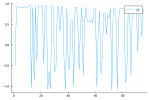

In [ ]:
meanfunctions = zeros(95)
for i in 1:95
meanfunctions[i] = means[B[i,1]]
end

plot(meanfunctions)

In [ ]:
mini = zeros(95,1)
for i in 1:95
mini[i] = minimum(functions[i,:])
end
mini

95×1 Matrix{Float64}:
 -0.5647474726345884
  0.8454873717358546
  0.8482256756214089
  0.8365460325781737
  0.8240078923747947
  0.8184615965924821
  0.8173101677117038
  0.8325181010600619
  0.8136116563897442
  0.8162109977722782
  0.8416414352646585
  0.8399469451734514
 -1.1684117172872788
  ⋮
  0.6930825146637386
  0.6650732605095204
 -0.9747867055742345
  0.6960733653053551
  0.6960848946542451
  0.7053674730977323
  0.7029008258289781
 -0.4180916027912913
  0.6629725474357789
  0.6629584853046647
 -0.0641472692608911
  0.6630943983256553

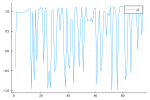

In [ ]:
maxi = zeros(95,1)
for i in 1:95
maxi[i] = maximum(functions[i,:])
end
maxi
plot(maxi) 